# Проектная работа
# Рынок заведений общественного питания Москвы

**Оглавление:**
1. [Описание проекта](#project_description)
2. [Описание данных](#data_description)
3. [План выполнения проекта](#implement_plan)
4. Проведение исследования
    - [Шаг 1. Загрузка данных и изучение общей информации;](#initial_data)
    - [Шаг 2. Предобработка данных;](#data_processing)
    - [Шаг 3. Анализ данных;](#data_analysis)
    - [Шаг 4. Детализация исследования;](#research_detailisation)
    - [Шаг 5. Подготовка презентации.](#presentation)
5. [Выводы](#conclusions)

## Описание проекта <a id="description"></a> 
Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.
Необходимо подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

Исходными данными является датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.

## Описание данных <a id="data_description"></a> 
Файл `moscow_places.csv` содержит:
- `name` — название заведения;
- `address` — адрес заведения;
- `category` — категория заведения, например «кафе», «пиццерия» или «кофейня»;
- `hours` — информация о днях и часах работы;
- `lat` — широта географической точки, в которой находится заведение;
- `lng` — долгота географической точки, в которой находится заведение;
- `rating` — рейтинг заведения по оценкам пользователей в Яндекс Картах (высшая оценка — 5.0);
- `price` — категория цен в заведении, например «средние», «ниже среднего», «выше среднего» и так далее;
- `avg_bill` — строка, которая хранит среднюю стоимость заказа в виде диапазона, например:
    - «Средний счёт: 1000–1500 ₽»;
    - «Цена чашки капучино: 130–220 ₽»;
    - «Цена бокала пива: 400–600 ₽».
    - и так далее;
- `middle_avg_bill` — число с оценкой среднего чека, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Средний счёт»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Средний счёт», то в столбец ничего не войдёт.
- `middle_coffee_cup` — число с оценкой одной чашки капучино, которое указано только для значений из столбца avg_bill, начинающихся с подстроки «Цена одной чашки капучино»:
    - Если в строке указан ценовой диапазон из двух значений, в столбец войдёт медиана этих двух значений.
    - Если в строке указано одно число — цена без диапазона, то в столбец войдёт это число.
    - Если значения нет или оно не начинается с подстроки «Цена одной чашки капучино», то в столбец ничего не войдёт.
- `chain` — число, выраженное 0 или 1, которое показывает, является ли заведение сетевым (для маленьких сетей могут встречаться ошибки):
    - 0 — заведение не является сетевым
    - 1 — заведение является сетевым
- `district` — административный район, в котором находится заведение, например Центральный административный округ;
- `seats` — количество посадочных мест.

## План выполнения проекта <a id="implement_plan"></a> 
- Шаг 1. Загрузка данных и изучение общей информации;
- Шаг 2. Предобработка данных;
- Шаг 3. Анализ данных;
- Шаг 4. Детализация исследования;
- Шаг 5. Подготовка презентации.

## Шаг 1. Загрузка данных и изучение общей информации<a id="initial_data"></a> 
Импортируем библиотеки и загрузим данные

In [41]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns

import json
# импортируем карту и маркер и хороплет
from folium import Map, Choropleth, Marker

# импортируем кластер
from folium.plugins import MarkerCluster
# импортируем собственные иконки
from folium.features import CustomIcon

In [99]:
data = pd.read_csv('/datasets/moscow_places.csv')

data.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [100]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Проверим значения столбца `chain`:

In [101]:
data['chain'].unique()

array([0, 1])

Столбец `chain` содержит два типа значений и его тип можно изменить на bool:

In [102]:
data['chain'] = data['chain'].astype({'chain':'bool'})

Проверим преобразование выведя информацию о датасете:

In [103]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   bool   
 13  seats              4795 non-null   float64
dtypes: bool(1), float64(6), object(7)
memory usage: 862.1+ KB


**Итоги:**
- имеется база даных из 8406 заведений в городе Москва с местоположением, временем работы, оценкой посетителей и средней стоимостью в заведении;
- Названия заведений, категории, адреса, районы, время работы, категория цен и средний чек представлены в виде строк
- Данные о локации, рейтингу, средней стоимости кофе/чека и кол-во мест представлены числами.
- Данные о принадлежности к сети представлены булевыми значениями.

## Шаг 2. Предобработка данных <a id="data_processing"></a> 
Проверяем наличие дубликатов:

In [104]:
data.duplicated().sum()

0

Полных дубликатов нет.

В некоторых столбцах есть пропуски:
- `hours` - часы работы - следует оставить пропуски, так как заменить их нечем;
- `price` - категория цен - можно было бы провести анализ имеющихся категорий по данным о ценах и проставить у оставшихся, но кол-во пропусков слишком велико, из-за чего такое заполнение может значительно исказить результаты исследования;
- `avg_bill`, `middle_avg_bill`, `middle_coffee_cup` - содержат информацию о стоимости услуг, при этом столбцы связаны. Заполнение пропусков не представляется возможным.
- `seats` - кол-во мест в заведении - можно посмотреть на тип заведения, возможно некоторые не предполагают наличие мест, в таком случае пропуски в них можно заменить нулями.

In [105]:
data[data['seats'].isna()]['category'].unique()

array(['кафе', 'кофейня', 'пиццерия', 'бар,паб', 'булочная', 'столовая',
       'быстрое питание', 'ресторан'], dtype=object)

Во всех случаях пропусков заведения предполашают места для посетителей, поэтому заменить пропуски нулями нельзя.

Создадим столбец `street` с названиями улиц из столбца с адресом:

In [106]:
# разделим текст в адресе по столбцам, на втором месте всегда указывается улица
data['street'] = data['address'].str.split(',', expand=True, n=0)[1]

Создадим столбец `is_24/7` с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
- логическое значение `True` — если заведение работает ежедневно и круглосуточно;
- логическое значение `False` — в противоположном случае.

In [107]:
data['is_24/7'] = False

data.loc[
    (data['hours'].str.find('ежедневно, круглосуточно') != -1) &
    (data['hours'].notna()),
    'is_24/7'
] = True

Проверим датасет на неявные дубликаты.

Проверка по названиям в лоб будет неэффективна из-за очень большого кол-ва уникальных названий заведений:

In [108]:
data['name'].nunique()

5614

Но можно предположить основные причины возникновения дублей:
- Неправильное указание названия одного и того же заведения;
- Неправильное указание одной и той-же сети.

Начнем с проверки первого. Для начала определим какое количество заведений имеет один и тот же адрес и категорию(предполагаем, что адрес тоже может быть написан с различиями, поэтому используем координаты):

In [109]:
data[['lat', 'lng', 'category']].duplicated(keep=False).sum()

36

Теперь выведем список названий этих заведений:

In [110]:
data[data[['lat', 'lng', 'category689']].duplicated(keep=False)].sort_values(by=['lat', 'lng'])['name'].unique()

array(['Хинкальная', 'Старый дворик', 'Fibo Pasta & Ravioli', 'Bổ',
       'Campus', 'Loft-cafe академия', 'Кофе', 'Суши Мания', 'Эдельвейс',
       'Восточная кухня', 'Prime', 'Белочка', 'Белая Птица', 'Союз Кофе',
       'Пельменная-вареничная', 'Пловная-чебуречная', 'Чайхона №1',
       'Steak it easy', 'Leon', 'Леон', 'Ava', 'Patriki',
       'Кафе-кулинария Сикварули', 'Сикварули', 'Чайхана Doner кафе',
       'Чайхана Döner', 'More poke', 'More Poke', 'Dragon bubble tea',
       'Dragon Mixology Bar', 'Georgian Garden', 'Позы&Буузы', 'Meat Лав',
       'Family Cafe Mayak', 'Встреча', 'Карелия'], dtype=object)

Видим 2 неявных дубликата - 'Leon', 'Леон' и 'More poke', 'More Poke'.

Теперь попробуем найти неявные дубликаты среди сетей:

In [111]:
data[data['chain'] == 1]['name'].sort_values().unique()

array(['1-я Креветочная', '10 Идеальных Пицц', '18 Грамм', '4 Сезона',
       '7 Сэндвичей', '8 Вафель', '9 Bar Coffee', 'ABC Coffee Roasters',
       'Air Coffee', 'Americano Black Coffee & Food', 'Arabix',
       'Arcus Bar And Food', 'Asia Gourmet', 'BB&Burgers', 'BFL’S',
       'Bakery', 'Bfl’s', 'BigСуши', 'Black Star Burger', 'Bodrero',
       'Bon Lavash', 'Boston seafood & bar', 'Bowl Family',
       'Brasserie Lambic', 'Bro&n', 'Brooms', 'Burger Club',
       'Burger Heroes', 'Bổ', 'CHICKO', 'Cafe', 'Cafe inn',
       'Café de Paris', 'Camera Obscura', 'Camorra Pizza e Birra',
       'Campus', 'Cassette Cafe', 'Chicha San Chen', 'Cinnabon',
       'City life', 'CofeFest', 'Coffee Bean', 'Coffee Break',
       'Coffee Guru', 'Coffee Like', 'Coffee Moose', 'Coffee Music',
       'Coffee Party', 'Coffee Point', 'Coffee Way',
       'Coffee and the City', 'Coffee in', "CoffeeBar'17", 'CoffeeShots',
       'Coffeebrain', "Coffeekaldi's", 'Coffeeshop Company',
       'Coffeesphere',

Есть следующие дубликаты: 'BFL’S'- 'Bfl’s', 'Deli2Go' - 'Deli2go', 'Wild Bean Cafe' - 'Wild bean cafe', 'ДаблБи' - 'Даблби', 'Донер Кебаб' - 'Донер кебаб', 'Как Дома' - 'Как дома', 'Кафе бар' - 'Кафе-бар', 'Крошка Картошка' - 'Крошка картошка', 'Лепим и Варим' - 'Лепим и варим', 'Мое кафе' - 'Моё кафе', 'Яндекс Лавка' - 'Яндекс.Лавка'.

Проведем замену всех найденых дубликатов и еще раз сделаем проверку на полные дубликаты:

In [112]:
data = data.replace({'Leon':'Леон', 'More poke':'More Poke', 'BFL’S':'Bfl’s', 'Deli2Go':'Deli2go',
                     'Wild Bean Cafe':'Wild bean cafe', 'ДаблБи':'Даблби', 'Донер Кебаб':'Донер кебаб',
                     'Как Дома':'Как дома', 'Кафе бар':'Кафе-бар', 'Крошка Картошка':'Крошка картошка',
                     'Лепим и Варим':'Лепим и варим', 'Мое кафе':'Моё кафе', 'Яндекс Лавка':'Яндекс.Лавка'})

data.duplicated().sum()

0

Проверим какие из дубликатов, найденных по местоположению, остались в базе:

In [115]:
data[data['name'] == 'Леон']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1053,Леон,ресторан,"Москва, проспект Мира, 119, стр. 10",Северо-Восточный административный округ,"вт-пт 12:00–20:00; сб,вс 12:00–22:00",55.829632,37.629695,4.0,NaN,NaN,NaN,NaN,True,NaN,проспект Мира,False
5314,Леон,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.3,NaN,NaN,NaN,NaN,True,NaN,улица Металлургов,False
5316,Леон,ресторан,"Москва, улица Металлургов, 29А",Восточный административный округ,пн-сб 11:00–23:00; вс 12:00–23:00,55.759603,37.791702,4.4,NaN,NaN,NaN,NaN,False,NaN,улица Металлургов,False


Из трех записей удалим последнюю - первая отличается от прочих адресом, а следовательно представляет другой ресторан, а вторая имеет пометку сети - скорее всего эта запись верная.

Теперь More Poke:

In [116]:
data[data['name'] == 'More Poke']

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
1430,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,False,188.0,Волоколамское шоссе,False
1511,More Poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,True,188.0,Волоколамское шоссе,False
6088,More Poke,ресторан,"Москва, Духовской переулок, 19",Южный административный округ,"ежедневно, 10:00–22:00",55.704177,37.612889,4.4,NaN,NaN,NaN,NaN,True,NaN,Духовской переулок,False


Аналогично предыдущему - удаляем строку 1430 - одно из заведений с совпадающим адресом и отсутствием метки сети.

Удалим выбранные строки:

In [117]:
data = data.drop(index=[5316, 1430])

**Итоги предобработки:**
- пропуски в базе оставлены без изменений;
- полные дубликаты отсутствуют;
- удалены неявные дубликаты;
- добавлен столбец с названием улиц;
- добавлен столбец с маркировкой круглосуточной и ежедневной работы.

## Шаг 3. Анализ данных <a id="data_analysis"></a> 
### Рассмотрим распределением заведений по различным категориям:

,category,name
3,кафе,2378
6,ресторан,2043
4,кофейня,1413
0,"бар,паб",765
5,пиццерия,633
2,быстрое питание,603
7,столовая,315
1,булочная,256


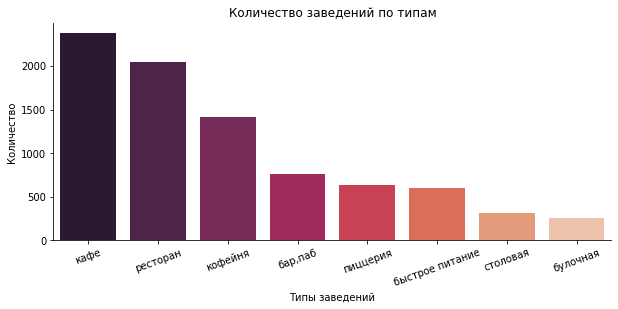

In [11]:
# сгруппируем заведения по категориям и посчитаем их количество
category = data.groupby('category', as_index=False).count()\
.sort_values(by='name', ascending=False)[['category', 'name']]
display(category)

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='name', data=category, palette="rocket")

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по типам')
plt.xlabel('Типы заведений')
plt.ylabel('Количество')

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=20)

#ax.bar_label() - не понимаю как добавить подписи значений к столбцам

# убираем ненужные границы
sns.despine()

Как видно из визуализации наибольшее кол-во заведений относится к кафе, ресторанам и кофейням. Можно сделать вывод, что они пользуются наибольшей популярностью. Меньше всего булочных и столовых, причем различие с лидерам более чем в 5 раз. 

### Количество посадочных мест по типам заведений
Учитывая, что заведения могу значительно отличаться размером проанализируем медианное, а не среднее количество мест.

,category,seats
6,ресторан,86.0
0,"бар,паб",82.5
4,кофейня,80.0
7,столовая,75.5
2,быстрое питание,65.0
3,кафе,60.0
5,пиццерия,55.0
1,булочная,50.0


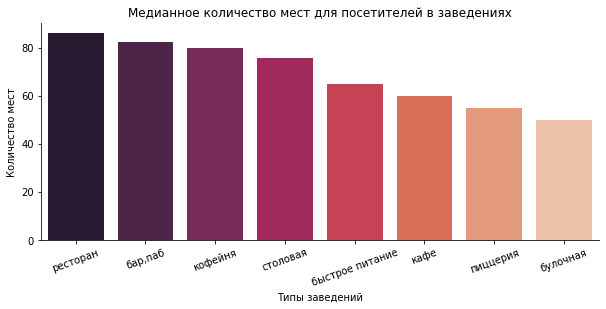

In [12]:
# сгруппируем заведения по категориям и посчитаем медианное количество посадочных мест
seats = data.groupby('category', as_index=False).median()\
.sort_values(by='seats', ascending=False)[['category', 'seats']]
display(seats)

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='seats', data=seats, palette="rocket")

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Медианное количество мест для посетителей в заведениях')
plt.xlabel('Типы заведений')
plt.ylabel('Количество мест')

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=20)

#ax.bar_label() - не понимаю как добавить подписи значений к столбцам

# убираем ненужные границы
sns.despine()

Медианное количество мест по заведениям отличается значительно меньше, чем количество самих заведений. Лидерами являются рестораны, бары и кофейни. В конце списка кафе, пиццерии и булочные. Такое распределение вполне объяснимо - рестораны, бары и кофейни расчитаны на длительное пребывание посетителей, следовательно и мест в них больше. А вот булочные, пиццерии и кафе обслуживают посетителей быстрее и мет им требуется меньше.

### Сетевые и несетевые заведения

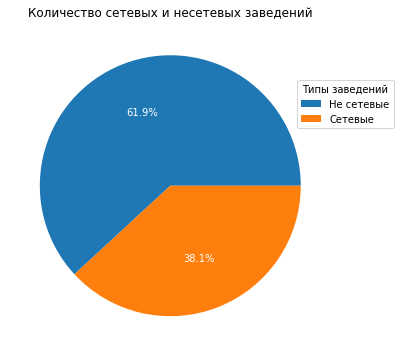

In [13]:
# сгруппируем заведения по сетевым/несетевым и посчитаем количество
chains = data.groupby('chain', as_index=False).count()\
.sort_values(by='name', ascending=False)[['chain', 'name']]

# строим круговую диаграмму
fig, ax = plt.subplots(figsize=(6, 6))
ax.pie(chains['name'], labels=chains['chain'], autopct='%1.1f%%', textprops=dict(color="w"));

# Настраиваем легенду
ax.legend(['Не сетевые', 'Сетевые'],
          title="Типы заведений",
          loc="center right",
          bbox_to_anchor=(1, 0, 0.2, 1.5))


# формируем заголовок графика и подписи осей средствами matplotlib
ax.set_title('Количество сетевых и несетевых заведений');

Согласно круговой диаграмме почти 2/3 всех заведений не являются сетевыми.

Исследуем это соотношение в разрезе типов заведений:

,category,chain,name
6,кафе,False,1599
12,ресторан,False,1313
7,кафе,True,779
13,ресторан,True,730
9,кофейня,True,720
8,кофейня,False,693
0,"бар,паб",False,596
4,быстрое питание,False,371
11,пиццерия,True,330
10,пиццерия,False,303


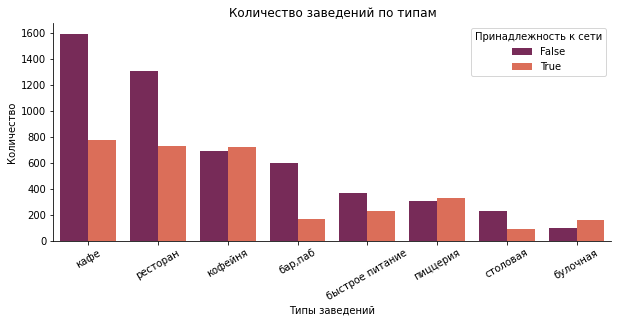

In [14]:
# сгруппируем заведения по категориям и посчитаем их количество
category_chain = data.groupby(['category', 'chain'], as_index=False).count()\
.sort_values(by='name', ascending=False)[['category', 'chain', 'name']]
display(category_chain)

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='name', data=category_chain, palette="rocket", hue='chain')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество заведений по типам')
plt.xlabel('Типы заведений')
plt.ylabel('Количество')

plt.legend(title='Принадлежность к сети')

# поворачиваем подписи значений по оси X на 30 градусов
plt.xticks(rotation=30)

#ax.bar_label() - не понимаю как добавить подписи значений к столбцам

# убираем ненужные границы
sns.despine()

В разрезе типов наблюдаются значительные различия в доле сетевых/несетевых заведений. Например, для кофеен, пиццерий и булочных характерно большее количество сетевых точек - это может быть объяснено различиями в ведении бизнеса и уровне расходов. Наименьшая доля сетевых заведений среди баров и пабов - чаще всего это единичные заведения.

### Наиболее популярные сети

,name,category
746,Шоколадница,120
344,Домино'с Пицца,76
340,Додо Пицца,74
148,One Price Coffee,71
759,Яндекс Лавка,69
59,Cofix,65
170,Prime,50
679,Хинкальная,44
378,КОФЕПОРТ,42
431,Кулинарная лавка братьев Караваевых,39


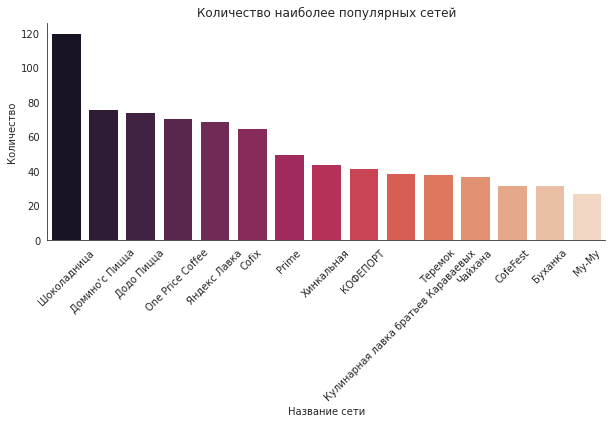

In [15]:
# сгруппируем заведения по названиям, посчитаем их количество(считаем только сетевые)
chain = data[data['chain'] == True].groupby('name', as_index=False).count()\
.sort_values(by='category', ascending=False)[['name', 'category']].head(15)
display(chain)

# используем стиль white из библиотеки seaborn
sns.set_style('white')

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='category', data=chain, palette="rocket")

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество наиболее популярных сетей')
plt.xlabel('Название сети')
plt.ylabel('Количество')

# поворачиваем подписи значений по оси X на 45 градусов
plt.xticks(rotation=45)

#ax.bar_label() - не понимаю как добавить подписи значений к столбцам

# убираем ненужные границы
sns.despine()

С большим отрывом лидирует сеть Шоколадница, за ней идут пиццерии Доминос и Додо.
Посмотрим к каким категориям относятся эти сети:

In [16]:
# соединим исходныю таблицу с типами заведений и названиями сетей и таблицу chain
chain.merge(data[['name', 'category']], left_on='name', right_on='name', how='left').drop_duplicates()

,name,category_x,category_y
0,Шоколадница,120,кофейня
7,Шоколадница,120,кафе
120,Домино'с Пицца,76,пиццерия
196,Додо Пицца,74,пиццерия
270,One Price Coffee,71,кофейня
341,Яндекс Лавка,69,ресторан
410,Cofix,65,кофейня
475,Prime,50,ресторан
512,Prime,50,кафе
525,Хинкальная,44,быстрое питание


Получается, что одним и тем же сетям может соответствовать несколько категорий, например лидер - Шоколадница - имеет и кафе и кофейни. Можно предположить, что тип заведения определяется мношими факторами, например районом, проходимостью и т.д.
### Административные районы и распределение заведений

In [17]:
# сгруппируем заведения по районам и категориям, посчитаем их количество
district = data.groupby(['district', 'category'], as_index=False).count()\
.sort_values(by=['district', 'category'])[['district', 'category', 'name']]\
.rename(columns = {'name':'count'})

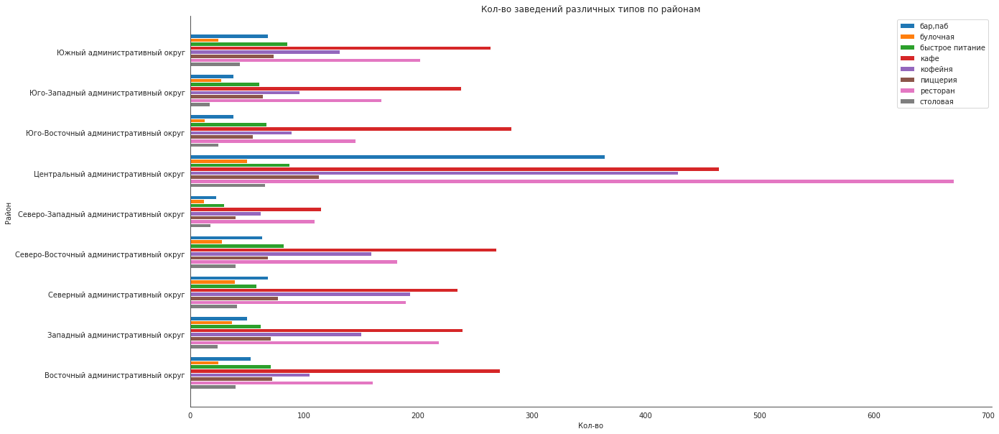

In [136]:
#Начальные параметры графика
N = district['district'].nunique() # уоличество районов
barWidth = 0.1                     # ширина столбца на графике
ypos = np.arange(N) / 1            # координаты начальных столбцов
#bottom = [0, 0, 0, 0, 0, 0, 0, 0, 0] #начальная координата по оси У - для построения диаграммы с накоплением

plt.figure(figsize=(20, 10))

# составляем график
for i in district['category'].unique():
    plt.barh(ypos,
             district[district['category'] == i]['count'],
             height=barWidth
            )
    ypos -= barWidth
            

# добавляем надписи, метки на оси Х и легенду
plt.xlabel('Кол-во')
plt.ylabel('Район')
plt.title('Кол-во заведений различных типов по районам')
plt.yticks (np.arange(N)-0.4, district['district'].unique())
#plt.yticks(rotation=45)
plt.legend(district['category'].unique());

#plt.show() 
# убираем ненужные границы
sns.despine()


Среди всех районов сильно выделяется ЦАО, что неудивительно - это место отдыха в выходные и работы в будние, следовательно людей всегда много, а большая проходимость позволяет увеличить продажи. Стоит отметить, что выделяются по кол-ву бары, кафе, кофейни и рестораны - то есть в первую очередь места отдыха, а не просто точки общепита. В то же время это значит, что и конкуренция в том районе наибольшая.

А вот СЗАО выделяется наименьшим кол-вом заведений по всем категориям.

### Средний рейтинг по категориям заведений

In [19]:
category_rating = data.groupby(['category'], as_index=False).mean()\
.sort_values(by='rating', ascending=False)[['category', 'rating']]\
.rename(columns = {'rating':'mean_rating'})

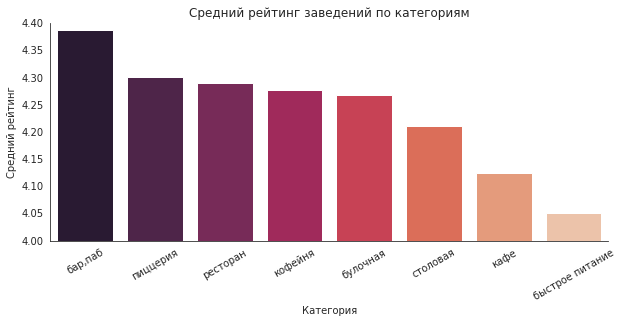

In [20]:
# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='category', y='mean_rating', data=category_rating, palette="rocket")

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Средний рейтинг заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Средний рейтинг')

# поворачиваем подписи значений по оси X на 30 градусов
plt.xticks(rotation=30)

# ограничим ось У для более явного отображения разницы в рейтингах
plt.ylim(4, 4.4)

#ax.bar_label() - не понимаю как добавить подписи значений к столбцам

# убираем ненужные границы
sns.despine()

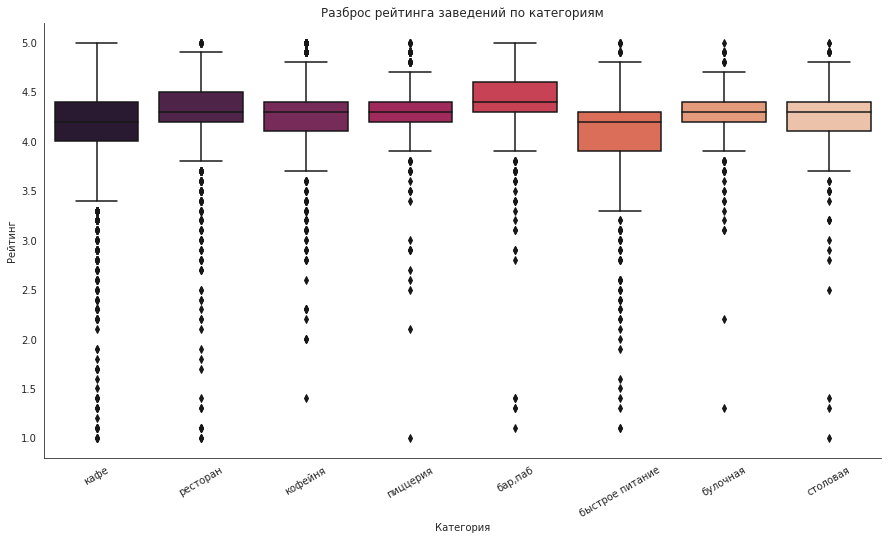

In [154]:
# назначаем размер графика
plt.figure(figsize=(15, 8))

# строим столбчатый график средствами seaborn
sns.boxplot(x='category', y='rating', data=data, palette="rocket")

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Разброс рейтинга заведений по категориям')
plt.xlabel('Категория')
plt.ylabel('Рейтинг')

# поворачиваем подписи значений по оси X на 30 градусов
plt.xticks(rotation=30)

#ax.bar_label() - не понимаю как добавить подписи значений к столбцам

# убираем ненужные границы
sns.despine()

Самые высокие рейтинги у баров и пиццерий, заметными аутсайдерами являются заведения быстрого питания. При этом стоит отметить, что все рейтинги находятся в диапазоне от 4 до 4.4 баллов, что весьма близко для пятибальной системы оценок.

### Рейтинг заведений по районам
Для начала получим информацию о среднем бале по району:

In [21]:
district_rating = data.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating')
district_rating

,district,rating
6,Юго-Восточный административный округ,4.101120
3,Северо-Восточный административный округ,4.148260
7,Юго-Западный административный округ,4.172920
0,Восточный административный округ,4.174185
1,Западный административный округ,4.181551
8,Южный административный округ,4.184417
4,Северо-Западный административный округ,4.208802
2,Северный административный округ,4.239778
5,Центральный административный округ,4.377520


Загрузим карту и добавим информацию о границах районов:

In [22]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

В ЦАО самые высокие рейтинги заведений, за ним следуют САО и СЗАО - там заведения предоставляют наилучший сервис.

### Карта заведений

In [23]:
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']} {row['rating']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

### Улицы с наибольшим количеством заведений
Определим название 15 улиц с наибольшим количеством заведений:

In [24]:
street_list = data.groupby(by='street', as_index=False)['name'].agg('count')\
.sort_values(by='name', ascending=False).head(15)
street_list

,street,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


Считаем количество заведений по категориям на каждой из отобранных улиц:

In [25]:
street_list = data[data['street'].isin(street_list['street'])].pivot_table(index='street',
                                                             columns='category',
                                                             values='name',
                                                             aggfunc='count',
                                                             fill_value=0
                                                            )
street_list

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
street,,,,,,,,
Варшавское шоссе,6,0,7,18,14,4,20,7
Дмитровское шоссе,6,2,10,23,11,8,24,4
Каширское шоссе,2,0,10,20,16,5,19,5
Кутузовский проспект,2,1,2,14,13,3,16,3
Ленинградский проспект,15,4,2,12,25,9,25,3
Ленинградское шоссе,5,2,5,13,13,3,26,3
Ленинский проспект,10,3,2,26,23,5,33,5
Люблинская улица,5,0,5,26,11,1,10,2
МКАД,1,0,9,45,4,0,5,1


Построим столбчатую диаграмму с накоплением:

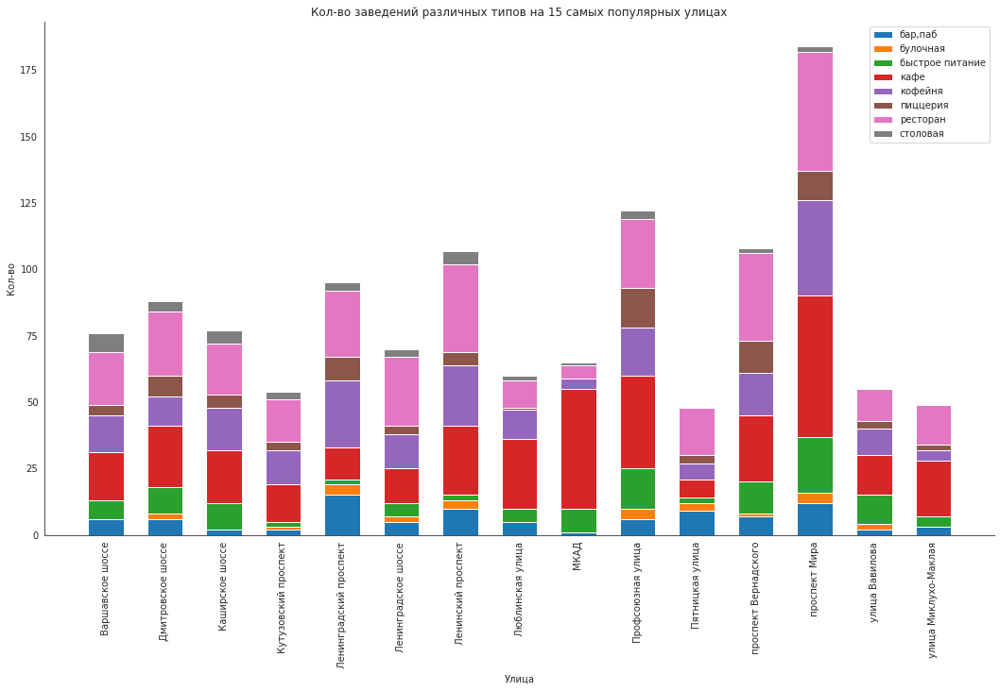

In [26]:
#Начальные параметры графика
N = street_list.index.nunique() # количество улиц
barWidth = 0.6                    # ширина столбца на графике
xloc = np.arange(N)         # координаты начальных столбцов
street_list['bottom'] = 0 #начальная координата по оси У - для построения диаграммы с накоплением

plt.figure(figsize=(18, 10))

# составляем график
for i in range(len(street_list.columns) - 1):
    plt.bar (xloc,
             street_list.iloc[:, i],
             width=barWidth,
             bottom=street_list['bottom']
            )
    street_list['bottom'] += street_list.iloc[:, i]
    
# добавляем надписи, метки на оси Х и легенду
plt.ylabel('Кол-во')
plt.xlabel('Улица')
plt.title('Кол-во заведений различных типов на 15 самых популярных улицах')
plt.xticks (xloc, street_list.index)
plt.xticks(rotation=90)
plt.legend(street_list.columns)

# убираем ненужные границы
sns.despine()

Лидером по общему количеству заведений является Проспект Мира, за ним следуют Профсоюзная удица, проспекты Ленинский и Вернадского. Вообще в данный список попали самые крупные "артерии" города - скорее всего из-за своей протяженности на них приходится статистически больше заведений.

Теперь посмотрим на улицы с единственным заведением:

In [27]:
small_streets = data.groupby(by='street', as_index=False)['name'].agg('count').sort_values(by='name', ascending=True)
small_streets = small_streets[small_streets['name'] == 1]

small_streets = data[data['street'].isin(small_streets['street'])]\
.pivot_table(index='street',
             columns='category',
             values='name',
             aggfunc='count',
             fill_value=0,
             margins=True,
             margins_name='Total')
small_streets

category,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая,Total
street,,,,,,,,,
1-й Автозаводский проезд,0,0,0,1,0,0,0,0,1
1-й Балтийский переулок,0,0,0,0,0,0,1,0,1
1-й Варшавский проезд,0,0,0,1,0,0,0,0,1
1-й Вешняковский проезд,0,0,0,1,0,0,0,0,1
1-й Голутвинский переулок,1,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...
улица Шкулёва 4,0,0,0,0,1,0,0,0,1
улица Шухова,0,0,0,0,0,0,1,0,1
улица Юннатов,0,0,0,0,0,0,0,1,1


Таких улиц довольно много, часть из них представляет собой проезды, переулки и тупики - можно предположить, что это либо небольшие улочки, либо улицы, расположенные вдали от людных мест. Около трети заведений на такиз улицах - кафе или кофейни.

### Расчитаем медианную стоимость чека в различных районах

In [28]:
district_med_bill = data.groupby(by='district', as_index=False)['middle_avg_bill'].agg('median')
district_med_bill.sort_values(by='middle_avg_bill', ascending=False)

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


И применим эти данные для индикатора на карте:

In [29]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_med_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='OrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

Полученное распределение соответствует самым престижным и дорогим районам города - ЦАО и ЗАО уверенно занимают первое место по величине чека, что неудивительно, чем престижнее район, тем выше аренда и некоторые другие расходы. Можно предположить, что чем дальше от центра, тем цены ниже.

### Зависимость среднего чека от рейтинга заведения
Посмотрим в каком диапазоне находятся рейтинги:

count    8406.000000
mean        4.229895
std         0.470348
min         1.000000
25%         4.100000
50%         4.300000
75%         4.400000
max         5.000000
Name: rating, dtype: float64

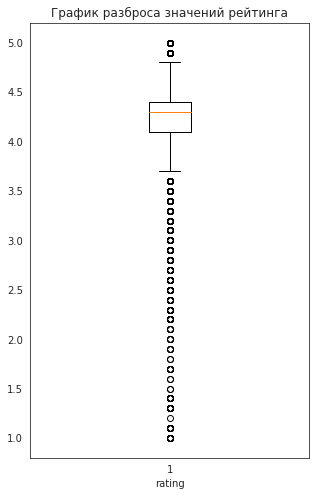

In [30]:
display(data['rating'].describe())

plt.figure(figsize=(5, 8))
plt.boxplot(data['rating'])
plt.title('График разброса значений рейтинга')
plt.xlabel('rating');

В основном значения колеблются от 3.6 до 4.7 баллов. Разделим заведения на категории согласно квартилям, а затем посчитаем средний чек в каждой категории:

,rating_cat,middle_avg_bill
0,A,1207.725772
1,B,881.948250
2,C,752.880721
3,D,561.592593


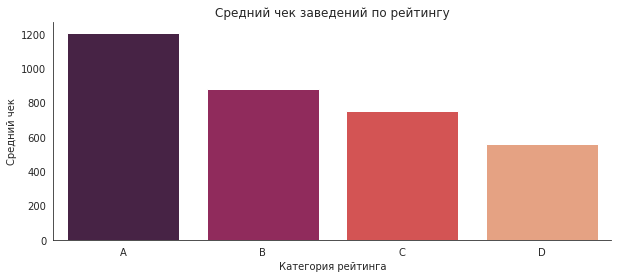

In [31]:
# сохраняем информацию о перцентилях
info = data['rating'].describe()

# объявляем функцию для категоризации
def cat(i):
    if i < info[4]:
        return 'D'
    if info[4] <= i < info[5]:
        return 'C'
    if info[5] <= i < info[6]:
        return 'B'
    else:
        return 'A'

# категоризируем завежения по рейтингам
data['rating_cat'] = data['rating'].apply(cat)

# считаем средний чек в каждой категории
cat_med_bill = data.groupby(by='rating_cat', as_index=False)['middle_avg_bill'].agg('mean')
display(cat_med_bill)

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='rating_cat', y='middle_avg_bill', data=cat_med_bill, palette="rocket")

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Средний чек заведений по рейтингу')
plt.xlabel('Категория рейтинга')
plt.ylabel('Средний чек')

# убираем ненужные границы
sns.despine()

Вполне ожидаемая картина - в дорогих заведениях обслуживание лучше(а отзывы как рузультат выше) и посетители готовы за это доплачивать. Крайние категории отличаются по среднему чеку в два раза, что довольно много.

### Вывод по анализу данных:
#### Распределением заведений по различным категориям
Наибольшее кол-во заведений относится к кафе, ресторанам и кофейням. Можно сделать вывод, что они пользуются наибольшей популярностью. Меньше всего булочных и столовых, причем различие с лидерам более чем в 5 раз. 

|	Категория|	Количество заведений|
|-----------|-------|
|	кафе	|2378|
|	ресторан	|2043|
|	кофейня	|1413|
|	бар,паб	|765|
|	пиццерия	|633|
|	быстрое питание	|603|
|	столовая	|315|
|	булочная	|256|

#### Количество посадочных мест по типам заведений
Лидерами являются рестораны, бары и кофейни. В конце списка кафе, пиццерии и булочные. Такое распределение вполне объяснимо - рестораны, бары и кофейни расчитаны на длительное пребывание посетителей, следовательно и мест в них больше. А вот булочные, пиццерии и кафе обслуживают посетителей быстрее и мет им требуется меньше.

|	Категория|	Количество мест|
|-----------|-------|
|	ресторан	|86.0|
|	бар,паб	|82.5|
|	кофейня	|80.0|
|	столовая	|75.5|
|	быстрое питание	|65.0|
|	кафе	|60.0|
|	пиццерия	|55.0|
|	булочная	|50.0|

#### Сетевые и несетевые заведения
Согласно данным 61.9% всех заведений не являются сетевыми. Но в разрезе типов наблюдаются значительные различия в доле сетевых/несетевых заведений. Например, для кофеен, пиццерий и булочных характерно большее количество сетевых точек - это может быть объяснено различиями в ведении бизнеса и уровне расходов. Наименьшая доля сетевых заведений среди баров и пабов - чаще всего это единичные заведения.

|Категория	|Сетевые	|Несетевые|
|----------|---------|--------|
|	кафе	|779	|1599
|	ресторан |	730	|1313|
|	кофейня	|720| 693|
|	бар,паб	|169	|596|
|	быстрое питание |232 |	371|
|	пиццерия|	330|303|
|	столовая|	88	|227|
|	булочная|	157|	99|


#### Наиболее популярные сети
С большим отрывом лидирует сеть Шоколадница, за ней идут пиццерии Доминос и Додо.

|Название сети|	Кол-во заведений|
|-----|--------|
|	Шоколадница	|120|
|	Домино'с Пицца|	76|
|	Додо Пицца	|74|
|	One Price Coffee|	71|
|	Яндекс Лавка	|69|
|	Cofix	|65|
|	Prime	|50|
|	Хинкальная	|44|
|	КОФЕПОРТ	|42|
|	Кулинарная лавка братьев Караваевых|	39|
|	Теремок	|38|
|	Чайхана	|37|
|	CofeFest|	32|
|	Буханка	|32|
|	Му-Му	|27|

#### Распределение заведений по районам
Среди всех районов сильно выделяется ЦАО, что неудивительно - это место отдыха в выходные и работы в будние, следовательно людей всегда много, а большая проходимость позволяет увеличить продажи. Стоит отметить, что выделяются по кол-ву бары, кафе, кофейни и рестораны - то есть в первую очередь места отдыха, а не просто точки общепита. В то же время это значит, что и конкуренция в том районе наибольшая.

А вот СЗАО выделяется наименьшим кол-вом заведений по всем категориям.

#### Средний рейтинг по категориям заведений
Самые высокие рейтинги у баров и пиццерий, заметными аутсайдерами являются заведения быстрого питания. При этом стоит отметить, что все рейтинги находятся в диапазоне от 4 до 4.4 баллов, что весьма близко для пятибальной системы оценок.

#### Рейтинг заведений по районам
В ЦАО самые высокие рейтинги заведений, за ним следуют САО и СЗАО - там заведения предоставляют наилучший сервис.

|Район|	Рейтинг|
|--------|--------|
|Восточный административный округ|	4.17|
|	Западный административный округ|	4.18|
|	Северный административный округ	|4.24|
|	Северо-Восточный административный округ|	4.15|
|	Северо-Западный административный округ	|4.21|
|	Центральный административный округ	|4.38|
|	Юго-Восточный административный округ|	4.10|
|	Юго-Западный административный округ	|4.17|
|	Южный административный округ	|4.18|

#### Улицы с наибольшим количеством заведений
Лидером по общему количеству заведений является Проспект Мира, за ним следуют Профсоюзная удица, проспекты Ленинский и Вернадского. Вообще в данный список попали самые крупные "артерии" города - скорее всего из-за своей протяженности на них приходится статистически больше заведений.

|Улица	|Кол-во заведений|
|-------|------------|
|	проспект Мира	|184|
|	Профсоюзная улица	|122|
|	проспект Вернадского	|108|
|	Ленинский проспект	|107|
|	Ленинградский проспект	|95|
|	Дмитровское шоссе	|88|
|	Каширское шоссе	|77|
|	Варшавское шоссе|	76|
|	Ленинградское шоссе|	70|
|	МКАД	|65|
|	Люблинская улица|	60|
|	улица Вавилова	|55|
|	Кутузовский проспект|	54|
|	улица Миклухо-Маклая|	49|
|	Пятницкая улица	|48|

#### Медианная стоимость чека в различных районах
Полученное распределение соответствует самым престижным и дорогим районам города - ЦАО и ЗАО уверенно занимают первое место по величине чека, что неудивительно, чем престижнее район, тем выше аренда и некоторые другие расходы. Можно предположить, что чем дальше от центра, тем цены ниже.

|Район	|Средний чек|
|------|---------|
|	Западный административный округ|	1000|
|	Центральный административный округ|	1000|
|	Северо-Западный административный округ|	700|
|	Северный административный округ	|650|
|	Юго-Западный административный округ|	600|
|	Восточный административный округ	|575|
|	Северо-Восточный административный округ|	500|
|	Южный административный округ	|500|
|	Юго-Восточный административный округ|	450|

#### Зависимость величины среднего чека от рейтинга заведения
В дорогих заведениях обслуживание лучше(а отзывы как рузультат выше) и посетители готовы за это доплачивать. Крайние категории отличаются по среднему чеку в два раза, что довольно много.

|Категория рейтинга|	Средний чек, руб.|
|-------|---------|
|A|	1207|
|	B|	881|
|	C|	752|
|	D|	561|



## Детализация исследования <a id="research_detailisation"></a> 
Задача - выделение информации для определения вероятности успеха открытия кофейни в Москве.

### Общее количество кофеен
Расчитаем сколько кофеен имеется в каждом районе города:

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


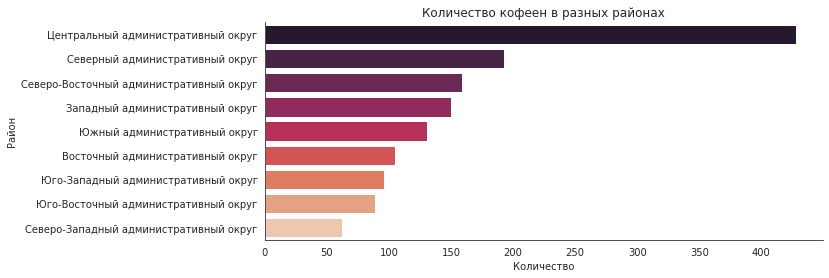

In [32]:
# составим датасет только из кофеен
coffee_house = data[data['category'] == 'кофейня']

# считаем количество кофеен по районам
ch_distr = coffee_house.groupby(by='district', as_index=False)\
.agg('count').sort_values(by='name', ascending=False)[['district', 'name']]
display(ch_distr)

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='name', y='district', data=ch_distr, palette="rocket", orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество кофеен в разных районах')
plt.xlabel('Количество')
plt.ylabel('Район')

# убираем ненужные границы
sns.despine()

Ниабольшая конкуренция в ЦАО, наименьшая в СЗАО. Причем ЦАО является абсолютным лидером - более чес 2 раза обгоняя САО на втором месте. В других районах разница в количестве кофеен меньше. 

Круглосуточные кофейни:

,district,is_24/7
5,Центральный административный округ,26
1,Западный административный округ,9
7,Юго-Западный административный округ,7
0,Восточный административный округ,5
2,Северный административный округ,5
3,Северо-Восточный административный округ,3
4,Северо-Западный административный округ,2
6,Юго-Восточный административный округ,1
8,Южный административный округ,1


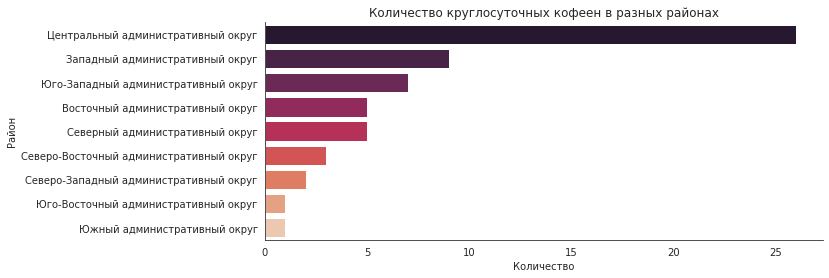

In [33]:
# считаем количество ркушлосуточных кофеен по районам
ch_24_7 = coffee_house.groupby(by='district', as_index=False)\
.agg('sum').sort_values(by='is_24/7', ascending=False)[['district', 'is_24/7']]
display(ch_24_7)

# назначаем размер графика
plt.figure(figsize=(10, 4))

# строим столбчатый график средствами seaborn
sns.barplot(x='is_24/7', y='district', data=ch_24_7, palette="rocket", orient='h')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Количество круглосуточных кофеен в разных районах')
plt.xlabel('Количество')
plt.ylabel('Район')

# убираем ненужные границы
sns.despine()

Снова лидирует ЦАО - что неудивительно при таком большом количестве кофеен. В остальных районах круглосуточных кофеен значительно меньше, но есть как минимум одна.

Распределение рейтинга у кофеен:

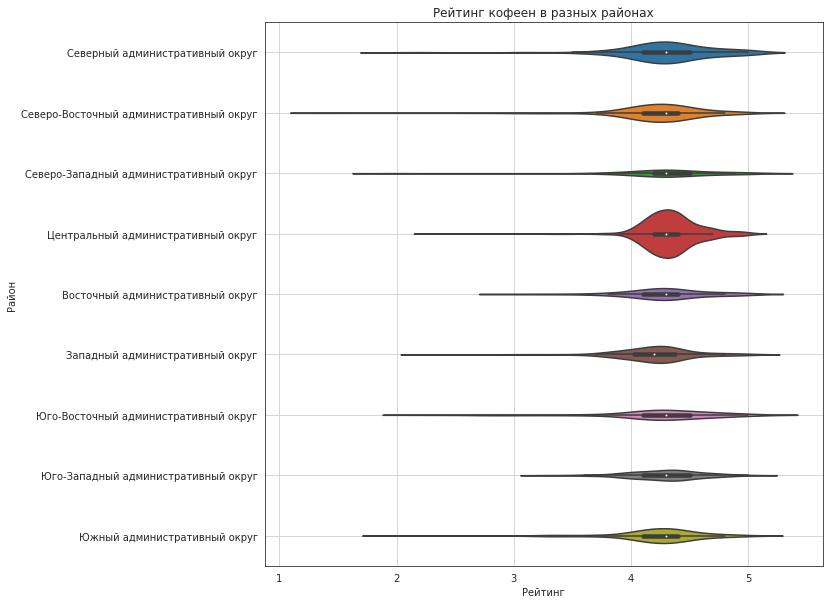

In [34]:
# назначаем размер графика
plt.figure(figsize=(10, 10))

# строим столбчатый график средствами seaborn
sns.violinplot(data=coffee_house,
               x="rating",
               y="district",
               orient='h',
              scale='count')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Рейтинг кофеен в разных районах')
plt.xlabel('Рейтинг')
plt.ylabel('Район')
plt.grid(True)


В целом картина весьма схожа по всем районам - средние значения ретинга несколько больше 4. Толщины графиков отображают кол-во отзывов - так, у кофеен ЦАО отзывов больше всего. Масштабируем график:

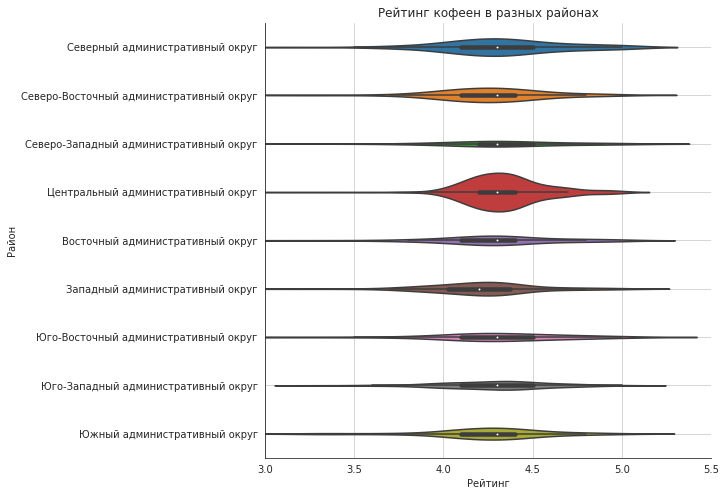

In [35]:
# назначаем размер графика
plt.figure(figsize=(8, 8))

# строим столбчатый график средствами seaborn
sns.violinplot(data=coffee_house,
               x="rating",
               y="district",#['САО', 'СВАО', 'СЗАО', 'ЦАО', 'ВАО', 'ЗАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'],#
               orient='h',
              scale='count')

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Рейтинг кофеен в разных районах')
plt.xlabel('Рейтинг')
plt.ylabel('Район')
plt.grid(True)
#plt.yticks(label=['САО', 'СВАО', 'СЗАО', 'ЦАО', 'ВАО', 'ЗАО', 'ЮВАО', 'ЮЗАО', 'ЮАО'])

plt.xlim(3, 5.5)
#plt.xticks(rotation=30)
# убираем ненужные границы
sns.despine()

Медианное значение рейтинга для разных районов почти не отличается, а вот разброс может отличаться - например в ЮЗАО нет кофеен с рейтингом ниже 3.

### Стоимость чашки кофе
Посмотрим какие значения принимает стоимость чашки кофе:

count     521.000000
mean      175.055662
std        89.753009
min        60.000000
25%       124.000000
50%       170.000000
75%       225.000000
max      1568.000000
Name: middle_coffee_cup, dtype: float64

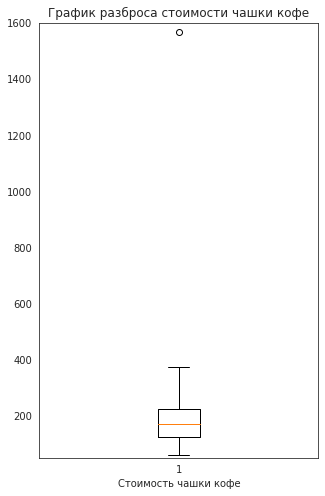

In [36]:
display(coffee_house['middle_coffee_cup'].describe())

plt.figure(figsize=(5, 8))
plt.ylim(50, 1600)
plt.boxplot(coffee_house[coffee_house['middle_coffee_cup'].notna()]['middle_coffee_cup'])
plt.title('График разброса стоимости чашки кофе')
plt.xlabel('Стоимость чашки кофе');

На графике разброса наблюдается аномальное значение - исключим все значения большк 400 при построении гистограммы.

Построим гистограмму и посмотрим на общее распределение по стоимости:

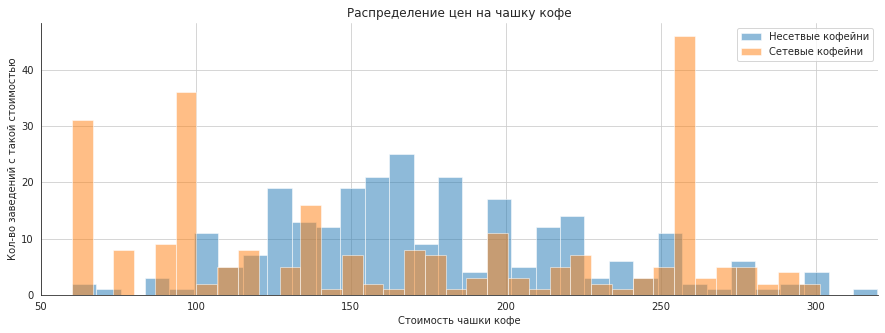

In [37]:
# назначаем размер графика
plt.figure(figsize=(15, 5))

# строим столбчатый график средствами seaborn
plt.hist(coffee_house[(coffee_house['middle_coffee_cup'] <= 400) &
                     (coffee_house['chain'] != 1)]['middle_coffee_cup'], bins=40, alpha=0.5)

plt.hist(coffee_house[(coffee_house['middle_coffee_cup'] <= 400) &
                     (coffee_house['chain'] == 1)]['middle_coffee_cup'], bins=40, alpha=0.5)

# формируем заголовок графика и подписи осей средствами matplotlib
plt.title('Распределение цен на чашку кофе')
plt.xlabel('Стоимость чашки кофе')
plt.ylabel('Кол-во заведений с такой стоимостью')
plt.xlim(50, 320)
plt.grid(True)
plt.legend(['Несетвые кофейни', 'Сетевые кофейни'])

# убираем ненужные границы
sns.despine()

Согласно графику стоимость чашки кофе колеблется от 60 до 300 рублей (с редкими превышениями). Интересно то, что стоимость кофе в несетевых кофейнях распределена более равномерно, чем в сетевых - возможно несетевые вынуждены следовать положению рынка, в то время как сетевые сами устанавливают правила и могут завышать/занижать стоимость(есть еще и фактор себестоимости продукта, но это задача для отдельного исследования).
Средняя и медианная стоимость близки и равны примерно 170 рублям. 

Если планируемое к открытию заведение не должно быть в бюджетном или премиальном сегменте, а также не будет сетевым, то эту стоиомсть следует взять за ориентир на начальном этапе. В таком случае заведение не отпугнет большой стоимостью кофе бюджетных посетителей, и в то же время не будет казаться слишком дешевым для других.
Если же политика при открытии заведения будет другой, например привлечение посетителей, то стоимость кофе можно опустить настолько, насколько позволит бюджет и объявить это как акцию, мотивируя клиентов посетить кафе.

### Карта расположения кофеен с рейтингом по району
Построим карту, на которой отобразим все имеющиейся в Москве кофейни и добавим цветовую индикацию для районов в зависимости от среднего рейтинга - такая карта поможет выбрать местоположение и визуализирует ситуацию с конкурентами. Также отразим сетевые и несетевые заведения разными иконками на карте.

Для начала посчитаем количество кофеен по районам:

In [38]:
ch_rating = coffee_house.groupby('district', as_index=False)['rating'].agg('mean').sort_values(by='rating')
ch_rating

,district,rating
1,Западный административный округ,4.195333
3,Северо-Восточный административный округ,4.216981
6,Юго-Восточный административный округ,4.225843
8,Южный административный округ,4.232824
0,Восточный административный округ,4.282857
7,Юго-Западный административный округ,4.283333
2,Северный административный округ,4.291710
4,Северо-Западный административный округ,4.325806
5,Центральный административный округ,4.336449


In [39]:
# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=ch_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='Greens',
    fill_opacity=0.8,
    legend_name='Средний рейтинг кофеен по районам',
).add_to(m);

Теперь добавим иконки для каждой кофейни на карту:

In [40]:
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    # сохраняем URL-адрес изображения
    icon_url = 'https://img.icons8.com/color/512/bookmark-ribbon--v1.png'
    # создаём объект с собственной иконкой размером 30x30
    icon = CustomIcon(icon_url, icon_size=(30, 30)) 
    
    # задаем условие применения иконки - сетевое заведение
    if row['chain'] == 0:
        Marker(
            [row['lat'], row['lng']],
            popup=f"{row['name']} {row['rating']}",
        ).add_to(marker_cluster)
    else:
        Marker(
            [row['lat'], row['lng']],
            popup=f"{row['name']} {row['rating']}",
            icon=icon
        ).add_to(marker_cluster)  
     
    
# применяем функцию create_clusters() к каждой строке датафрейма
coffee_house.apply(create_clusters, axis=1)

# выводим карту
m

**Рекомендации:**

Данная карта дает хорошее представление о конкуренции и ее качестве в разных районах Москвы. Например можно видеть, что в центре города большое количество кофеен и скорее всего обслуживание высокого качества - об этом говорит высокий рейтинг.

Если предположить, что кофейня не будет сетевой, то стоит рассмотреть район, с небольшим количеством кофеен (но достаточной проходимостью) и низким рейтингом у конкурентов - так будет проще привлечь клиентов. 

К районам с низким рейтингом относятся - ЗАО, СВАО, ЮВАО и ЮАО. Из них в ЮВАО и ЮАО меньше всего кофеен. 

Если выбирать более безопасное, с точки зрения конкуренции, место для открытия заведения, то эти два района отлично подойдут.

В то же время можно сделать упор на обеспеченных клиентов и попытаться закрыть потребность ЗАО - в нем относительно низкий рейтинг кофеен, а значит есть клиенты, которым не очень нравится имеющиеся заведения. В этом районе нужно будет сделать упор на сервис, но взамен можно поднять цены в ресторане - для района это нормально. Данный подход несет больше рисков с точки зрения конкуренции, но может принести дополнительный доход или более быструю окупаемость.

## Презентация <a id="presentation"></a> 
Презентация: https://drive.google.com/file/d/1CZkZUweD9EoSZqRPKwLH37HA7C_EMg5V/view?usp=sharing

## Общий вывод <a id="conclusion"></a> 

###   Описание задачи
Необходимо подготовить исследование рынка Москвы по заведениям обзественного питания и, в частности, кофейням, найти особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.

### Описание данных 
Исходными данными является датасет `moscow_places.csv` с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. В датасет вошли сведения о 8406 заведениях.

Датасет содержит информацию о:
 - названии;
 - адресе;
 - категории;
 - времени работы;
 - координатах;
 - рейтингу;
 - стоимости чека/кофе;
 - принадлежности к сети;
 - административном районе;
 - количестве посадочных мест.

### Обработка данных
- полные дубликаты отсутсвуют;
- удалены неявные дубликаты;
- добавлен столбец `street` с названием улиц;
- добавлен столбец `is_24/7` с маркировкой круглосуточной и ежедневной работы.


### Анализ данных
#### Распределением заведений по различным категориям
Наибольшее кол-во заведений относится к кафе, ресторанам и кофейням. Можно сделать вывод, что они пользуются наибольшей популярностью. Меньше всего булочных и столовых, причем различие с лидерам более чем в 5 раз. 

|	Категория|	Количество заведений|
|-----------|-------|
|	кафе	|2378|
|	ресторан	|2043|
|	кофейня	|1413|
|	бар,паб	|765|
|	пиццерия	|633|
|	быстрое питание	|603|
|	столовая	|315|
|	булочная	|256|

#### Количество посадочных мест по типам заведений
Лидерами являются рестораны, бары и кофейни. В конце списка кафе, пиццерии и булочные. Такое распределение вполне объяснимо - рестораны, бары и кофейни расчитаны на длительное пребывание посетителей, следовательно и мест в них больше. А вот булочные, пиццерии и кафе обслуживают посетителей быстрее и мет им требуется меньше.

|	Категория|	Количество мест|
|-----------|-------|
|	ресторан	|86.0|
|	бар,паб	|82.5|
|	кофейня	|80.0|
|	столовая	|75.5|
|	быстрое питание	|65.0|
|	кафе	|60.0|
|	пиццерия	|55.0|
|	булочная	|50.0|

#### Сетевые и несетевые заведения
Согласно данным 61.9% всех заведений не являются сетевыми. Но в разрезе типов наблюдаются значительные различия в доле сетевых/несетевых заведений. Например, для кофеен, пиццерий и булочных характерно большее количество сетевых точек - это может быть объяснено различиями в ведении бизнеса и уровне расходов. Наименьшая доля сетевых заведений среди баров и пабов - чаще всего это единичные заведения.

|Категория	|Сетевые	|Несетевые|
|----------|---------|--------|
|	кафе	|779	|1599
|	ресторан |	730	|1313|
|	кофейня	|720| 693|
|	бар,паб	|169	|596|
|	быстрое питание |232 |	371|
|	пиццерия|	330|303|
|	столовая|	88	|227|
|	булочная|	157|	99|


#### Наиболее популярные сети
С большим отрывом лидирует сеть Шоколадница, за ней идут пиццерии Доминос и Додо.

|Название сети|	Кол-во заведений|
|-----|--------|
|	Шоколадница	|120|
|	Домино'с Пицца|	76|
|	Додо Пицца	|74|
|	One Price Coffee|	71|
|	Яндекс Лавка	|69|
|	Cofix	|65|
|	Prime	|50|
|	Хинкальная	|44|
|	КОФЕПОРТ	|42|
|	Кулинарная лавка братьев Караваевых|	39|
|	Теремок	|38|
|	Чайхана	|37|
|	CofeFest|	32|
|	Буханка	|32|
|	Му-Му	|27|

#### Распределение заведений по районам
Среди всех районов сильно выделяется ЦАО, что неудивительно - это место отдыха в выходные и работы в будние, следовательно людей всегда много, а большая проходимость позволяет увеличить продажи. Стоит отметить, что выделяются по кол-ву бары, кафе, кофейни и рестораны - то есть в первую очередь места отдыха, а не просто точки общепита. В то же время это значит, что и конкуренция в том районе наибольшая.

А вот СЗАО выделяется наименьшим кол-вом заведений по всем категориям.

#### Средний рейтинг по категориям заведений
Самые высокие рейтинги у баров и пиццерий, заметными аутсайдерами являются заведения быстрого питания. При этом стоит отметить, что все рейтинги находятся в диапазоне от 4 до 4.4 баллов, что весьма близко для пятибальной системы оценок.

#### Рейтинг заведений по районам
В ЦАО самые высокие рейтинги заведений, за ним следуют САО и СЗАО - там заведения предоставляют наилучший сервис.

|Район|	Рейтинг|
|--------|--------|
|Восточный административный округ|	4.17|
|	Западный административный округ|	4.18|
|	Северный административный округ	|4.24|
|	Северо-Восточный административный округ|	4.15|
|	Северо-Западный административный округ	|4.21|
|	Центральный административный округ	|4.38|
|	Юго-Восточный административный округ|	4.10|
|	Юго-Западный административный округ	|4.17|
|	Южный административный округ	|4.18|

#### Улицы с наибольшим количеством заведений
Лидером по общему количеству заведений является Проспект Мира, за ним следуют Профсоюзная удица, проспекты Ленинский и Вернадского. Вообще в данный список попали самые крупные "артерии" города - скорее всего из-за своей протяженности на них приходится статистически больше заведений.

|Улица	|Кол-во заведений|
|-------|------------|
|	проспект Мира	|184|
|	Профсоюзная улица	|122|
|	проспект Вернадского	|108|
|	Ленинский проспект	|107|
|	Ленинградский проспект	|95|
|	Дмитровское шоссе	|88|
|	Каширское шоссе	|77|
|	Варшавское шоссе|	76|
|	Ленинградское шоссе|	70|
|	МКАД	|65|
|	Люблинская улица|	60|
|	улица Вавилова	|55|
|	Кутузовский проспект|	54|
|	улица Миклухо-Маклая|	49|
|	Пятницкая улица	|48|

#### Медианная стоимость чека в различных районах
Полученное распределение соответствует самым престижным и дорогим районам города - ЦАО и ЗАО уверенно занимают первое место по величине чека, что неудивительно, чем престижнее район, тем выше аренда и некоторые другие расходы. Можно предположить, что чем дальше от центра, тем цены ниже.

|Район	|Средний чек|
|------|---------|
|	Западный административный округ|	1000|
|	Центральный административный округ|	1000|
|	Северо-Западный административный округ|	700|
|	Северный административный округ	|650|
|	Юго-Западный административный округ|	600|
|	Восточный административный округ	|575|
|	Северо-Восточный административный округ|	500|
|	Южный административный округ	|500|
|	Юго-Восточный административный округ|	450|

#### Зависимость величины среднего чека от рейтинга заведения
В дорогих заведениях обслуживание лучше(а отзывы как рузультат выше) и посетители готовы за это доплачивать. Крайние категории отличаются по среднему чеку в два раза, что довольно много.

|Категория рейтинга|	Средний чек, руб.|
|-------|---------|
|A|	1207|
|	B|	881|
|	C|	752|
|	D|	561|

### Детализация исследования
#### Общее количество кофеен
Ниабольшая конкуренция в ЦАО, наименьшая в СЗАО. Причем ЦАО является абсолютным лидером - более чес 2 раза обгоняя САО на втором месте. В других районах разница в количестве кофеен меньше. 

|Район	|Кол-во|
|-------|-----|
|	Центральный административный округ|	428|
|	Северный административный округ|	193|
|	Северо-Восточный административный округ|	159|
|	Западный административный округ|	150|
|	Южный административный округ|	131|
|	Восточный административный округ|	105|
|	Юго-Западный административный округ|	96|
|	Юго-Восточный административный округ	|89|
|	Северо-Западный административный округ	|62|

#### Круглосуточные кофейни
Снова лидирует ЦАО - что неудивительно при таком большом количестве кофеен. В остальных районах круглосуточных кофеен значительно меньше, но есть как минимум одна.

|Район	|Кол-во|
|-------|-----|
|	Центральный административный округ	|26|
|	Западный административный округ	|9|
|	Юго-Западный административный округ|	7|
|	Восточный административный округ|	5|
|	Северный административный округ	|5|
|	Северо-Восточный административный округ|	3|
|	Северо-Западный административный округ|	2|
|	Юго-Восточный административный округ|	1|
|	Южный административный округ	|1|

#### Рейтинги кофеен
В целом картина весьма схожа по всем районам - средние значения рейтинга несколько больше 4. У кофеен распложенных в ЦАО отзывов больше всего. Медианное значение рейтинга для разных районов почти не отличается, а вот разброс может отличаться - например в ЮЗАО нет кофеен с рейтингом ниже 3.

#### Стоимость чашки кофе
Стоимость чашки кофе колеблется от 60 до 300 рублей (с редкими превышениями). Интересно то, что стоимость кофе в несетевых кофейнях распределена более равномерно, чем в сетевых - возможно несетевые вынуждены следовать положению рынка, в то время как сетевые сами устанавливают правила и могут завышать/занижать стоимость(есть еще и фактор себестоимости продукта, но это задача для отдельного исследования).
Средняя и медианная стоимость близки и равны примерно 170 рублям. 

**Рекомендации:**

Если планируемое к открытию заведение не должно быть в бюджетном или премиальном сегменте, а также не будет сетевым, то эту стоиомсть следует взять за ориентир на начальном этапе. В таком случае заведение не отпугнет большой стоимостью кофе бюджетных посетителей, и в то же время не будет казаться слишком дешевым для других.
Если же политика при открытии заведения будет другой, например привлечение посетителей, то стоимость кофе можно опустить настолько, насколько позволит бюджет и объявить это как акцию, мотивируя клиентов посетить кафе.

#### Распложение кофейни
**Рекомендации:**

Данная карта дает хорошее представление о конкуренции и ее качестве в разных районах Москвы. Например можно видеть, что в центре города большое количество кофеен и скорее всего обслуживание высокого качества - об этом говорит высокий рейтинг.

Если предположить, что кофейня не будет сетевой, то стоит рассмотреть район, с небольшим количеством кофеен (но достаточной проходимостью) и низким рейтингом у конкурентов - так будет проще привлечь клиентов. 

К районам с низким рейтингом относятся - ЗАО, СВАО, ЮВАО и ЮАО. Из них в ЮВАО и ЮАО меньше всего кофеен. 

Если выбирать более безопасное, с точки зрения конкуренции, место для открытия заведения, то эти два района отлично подойдут.

В то же время можно сделать упор на обеспеченных клиентов и попытаться закрыть потребность ЗАО - в нем относительно низкий рейтинг кофеен, а значит есть клиенты, которым не очень нравится имеющиеся заведения. В этом районе нужно будет сделать упор на сервис, но взамен можно поднять цены в ресторане - для района это нормально. Данный подход несет больше рисков с точки зрения конкуренции, но может принести дополнительный доход или более быструю окупаемость.